<a href="https://colab.research.google.com/github/sharvaniyadav/Automated-Component-Detection-in-PCB-Manufacturing-Using-YOLOv8-Project-3/blob/main/kms.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 898.7/898.7 kB 20.5 MB/s eta 0:00:00
Mounted at /content/drive


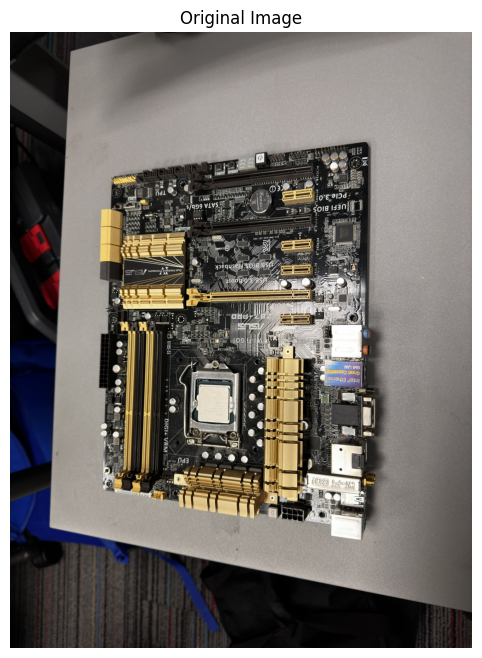

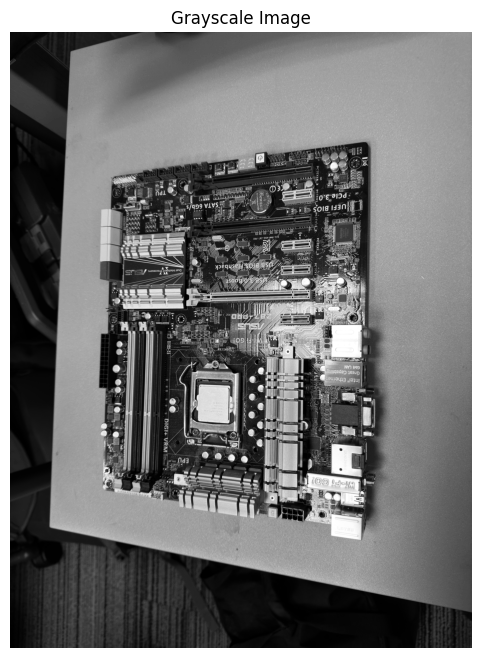

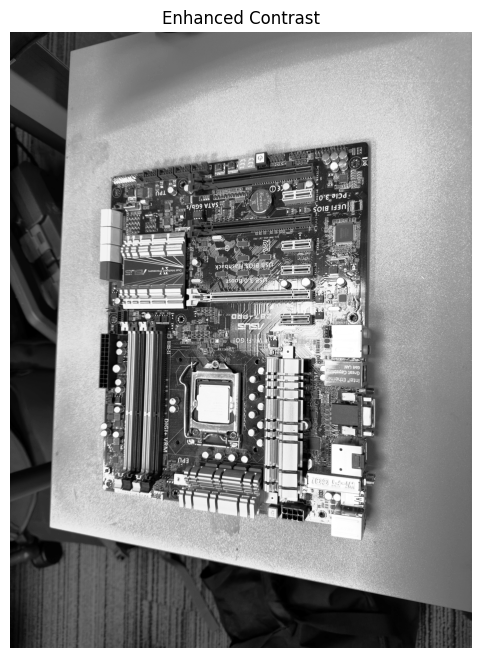

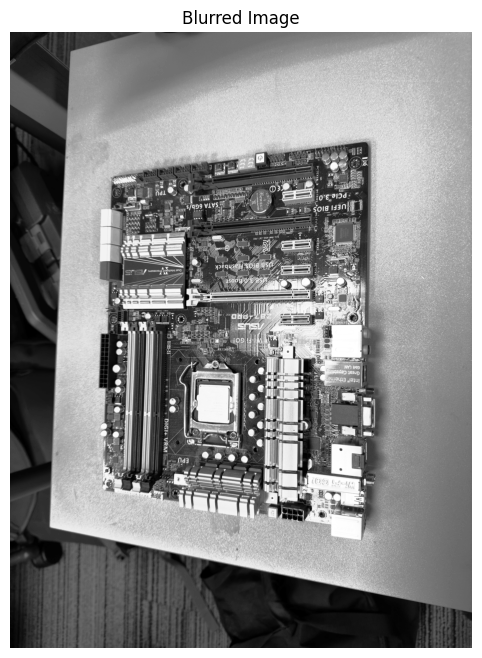

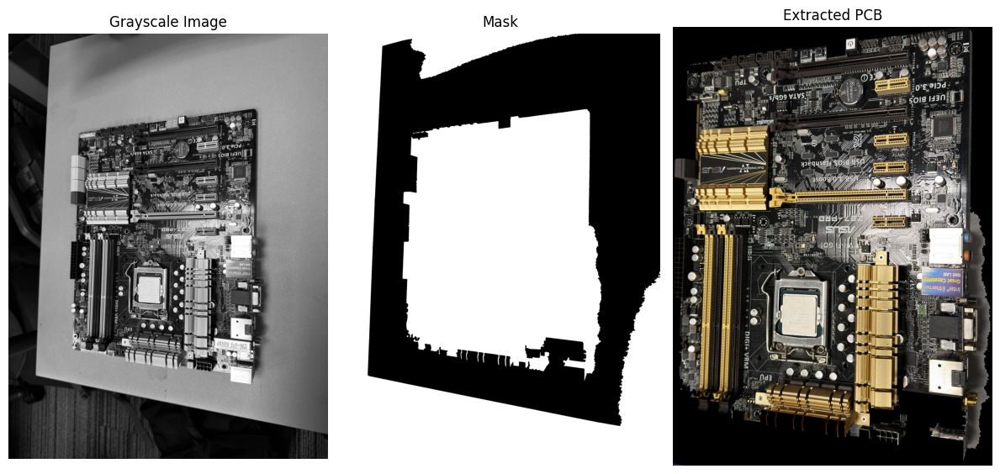

In [1]:
# Install Required Libraries
!pip install ultralytics --quiet
!pip install opencv-python-headless matplotlib Pillow --quiet

# Import Libraries
from google.colab import drive
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os
from IPython.display import Image, display

'''Step 1: Object Masking'''

# Step 1.1: Check and Mount Google Drive to Access the Dataset
if not os.path.exists('/content/drive/MyDrive'):
    drive.mount('/content/drive')
else:
    print("Google Drive is already mounted.")

# Step 1.2: Define the Path to Your Image and Load It
image_path = '/content/drive/MyDrive/data/motherboard_image.JPEG'
image = cv2.imread(image_path, cv2.IMREAD_COLOR)
if image is None:
    raise FileNotFoundError(f"Image at {image_path} could not be loaded. Check the file path.")

# Display the Original Image
plt.figure(figsize=(8, 8))
plt.title("Original Image")
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.axis("off")
plt.show()

# Step 1.3: Convert to Grayscale
grayscale_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# Display Grayscale Image
plt.figure(figsize=(8, 8))
plt.title("Grayscale Image")
plt.imshow(grayscale_image, cmap='gray')
plt.axis("off")
plt.show()

# Step 1.4: Enhance Contrast
contrast_enhanced_image = cv2.equalizeHist(grayscale_image)

# Display Enhanced Contrast Image
plt.figure(figsize=(8, 8))
plt.title("Enhanced Contrast")
plt.imshow(contrast_enhanced_image, cmap='gray')
plt.axis("off")
plt.show()

# Step 1.5: Apply Gaussian Blur
blurred_image = cv2.GaussianBlur(contrast_enhanced_image, (5, 5), 0)

# Display Blurred Image
plt.figure(figsize=(8, 8))
plt.title("Blurred Image")
plt.imshow(blurred_image, cmap='gray')
plt.axis("off")
plt.show()

# Step 1.6: Perform Thresholding
_, binary_image = cv2.threshold(
    blurred_image, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU
)

# Step 1.7: Morphological Cleaning
kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (5, 5))
cleaned_binary_image = cv2.morphologyEx(binary_image, cv2.MORPH_CLOSE, kernel)

# Step 1.8: Detect and Filter Contours
contours, _ = cv2.findContours(
    cleaned_binary_image, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE
)
filtered_contours = [c for c in contours if cv2.contourArea(c) > 50000]

if not filtered_contours:
    raise ValueError("No significant contours found. Consider adjusting parameters.")

# Step 1.9: Create a Mask
pcb_mask = np.zeros_like(grayscale_image)
cv2.drawContours(pcb_mask, filtered_contours, -1, 255, cv2.FILLED)

# Step 1.10: Refine Mask Boundaries
refinement_kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (10, 10))
refined_mask = cv2.erode(pcb_mask, refinement_kernel, iterations=1)

# Step 1.11: Extract the PCB
extracted_pcb = cv2.bitwise_and(image, image, mask=refined_mask)

# Step 1.12: Crop the PCB
x, y, w, h = cv2.boundingRect(max(filtered_contours, key=cv2.contourArea))
cropped_pcb = extracted_pcb[y:y+h, x:x+w]

# Step 1.13: Visualize Results
plt.figure(figsize=(12, 6))
plt.subplot(1, 3, 1)
plt.title("Grayscale Image")
plt.imshow(cv2.cvtColor(grayscale_image, cv2.COLOR_GRAY2RGB))
plt.axis("off")

plt.subplot(1, 3, 2)
plt.title("Mask")
plt.imshow(refined_mask, cmap="gray")
plt.axis("off")

plt.subplot(1, 3, 3)
plt.title("Extracted PCB")
plt.imshow(cv2.cvtColor(cropped_pcb, cv2.COLOR_BGR2RGB))
plt.axis("off")

plt.tight_layout()
plt.show()


In [2]:
'''Step 2: YOLOv8 Training'''

# Step 2.1: Import Necessary Libraries
from ultralytics import YOLO
print("Libraries imported successfully.")

# Step 2.2: Load the YOLOv8 Nano Model
model = YOLO('yolov8n.pt')
print("YOLOv8 Nano model loaded with pretrained weights.")

# Step 2.3: Set Up Training Configuration
dataset_config_path = '/content/drive/MyDrive/data/data.yaml'

# Validate dataset path
if not os.path.exists(dataset_config_path):
    raise FileNotFoundError(f"Dataset configuration file not found at: {dataset_config_path}")

# Training parameters
total_epochs = 165
images_per_training_batch = 8
initial_learning_rate_value = 0.0004
type_of_optimizer_used = 'AdamW'
regularization_weight_value = 0.001

# Data-related parameters
resolution_of_input_images = 960
enable_data_augmentation_process = True
enable_mixed_precision_training_mode = True

# Step 2.4: Start Model Training
print("Initiating the training phase. Please allow some time for completion.")

result = model.train(
    name='pcb_model_training_process',   # Custom model name
    data=dataset_config_path,            # Dataset configuration file path
    imgsz=resolution_of_input_images,    # Input image resolution
    batch=images_per_training_batch,     # Batch size for training
    epochs=total_epochs,                 # Number of training epochs
    lr0=initial_learning_rate_value,     # Initial learning rate
    optimizer=type_of_optimizer_used,    # Optimizer type
    amp=enable_mixed_precision_training_mode,  # Enable mixed precision
    augment=enable_data_augmentation_process,  # Enable data augmentation
    weight_decay=regularization_weight_value,  # Regularization term
    device=0                             # Use GPU for training
)

# Capture the output directory for trained weights
training_output_dir = result['save_dir']
print(f"Training results saved in: {training_output_dir}")

# Step 2.5: Confirm Saved Results
if not os.path.exists(training_output_dir) or not os.listdir(training_output_dir):
    raise ValueError(f"No files were saved in the output directory: {training_output_dir}")

print("Model training has been successfully completed!")

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
Libraries imported successfully.


100%|██████████| 6.25M/6.25M [00:00<00:00, 119MB/s]


YOLOv8 Nano model loaded with pretrained weights.
Initiating the training phase. Please allow some time for completion.
Ultralytics 8.3.49 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=/content/drive/MyDrive/data/data.yaml, epochs=165, time=None, patience=100, batch=8, imgsz=960, save=True, save_period=-1, cache=False, device=0, workers=8, project=None, name=pcb_model_training_process, exist_ok=False, pretrained=True, optimizer=AdamW, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=True, agnostic_nms=False, classes=None, retina_m

100%|██████████| 755k/755k [00:00<00:00, 18.8MB/s]


Overriding model.yaml nc=80 with nc=13

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      7360  ultralytics.nn.modules.block.C2f             [32, 32, 1, True]             
  3                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  4                  -1  2     49664  ultralytics.nn.modules.block.C2f             [64, 64, 2, True]             
  5                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  6                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  7                  -1  1    295424  ultralytic

100%|██████████| 5.35M/5.35M [00:00<00:00, 103MB/s]


AMP: checks passed ✅


train: Scanning /content/drive/MyDrive/data/train/labels... 544 images, 0 backgrounds, 0 corrupt: 100%|██████████| 544/544 [03:02<00:00,  2.98it/s]


train: New cache created: /content/drive/MyDrive/data/train/labels.cache
WARNING ⚠️ Box and segment counts should be equal, but got len(segments) = 26, len(boxes) = 108783. To resolve this only boxes will be used and all segments will be removed. To avoid this please supply either a detect or segment dataset, not a detect-segment mixed dataset.
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


/usr/local/lib/python3.10/dist-packages/albumentations/__init__.py:24: UserWarning: A new version of Albumentations is available: 1.4.22 (you have 1.4.20). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()
val: Scanning /content/drive/MyDrive/data/valid/labels... 105 images, 0 backgrounds, 0 corrupt: 100%|██████████| 105/105 [00:27<00:00,  3.78it/s]

val: New cache created: /content/drive/MyDrive/data/valid/labels.cache
WARNING ⚠️ Box and segment counts should be equal, but got len(segments) = 26, len(boxes) = 19108. To resolve this only boxes will be used and all segments will be removed. To avoid this please supply either a detect or segment dataset, not a detect-segment mixed dataset.


Plotting labels to runs/detect/pcb_model_training_process/labels.jpg... 
optimizer: AdamW(lr=0.0004, momentum=0.937) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.001), 63 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 960 train, 960 val
Using 2 dataloader workers
Logging results to runs/detect/pcb_model_training_process
Starting training for 165 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/165      9.25G      2.234       3.28      1.173       3225        960: 100%|██████████| 68/68 [00:39<00:00,  1.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:18<00:00,  2.67s/it]

                   all        105      19108     0.0377     0.0901     0.0417     0.0213



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/165      12.4G       2.14      2.659      1.126       1391        960: 100%|██████████| 68/68 [00:38<00:00,  1.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:15<00:00,  2.15s/it]

                   all        105      19108      0.228     0.0797     0.0727     0.0401



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/165      12.4G      2.124       2.44      1.106       2347        960: 100%|██████████| 68/68 [00:35<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:12<00:00,  1.81s/it]

                   all        105      19108      0.244      0.113     0.0827     0.0462



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/165        13G      2.058       2.32        1.1       1971        960: 100%|██████████| 68/68 [00:34<00:00,  1.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/7 [00:00<?, ?it/s]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:14<00:00,  2.10s/it]

                   all        105      19108      0.217      0.172      0.125     0.0743



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/165       9.9G      2.038       2.26      1.093       3201        960: 100%|██████████| 68/68 [00:39<00:00,  1.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:14<00:00,  2.12s/it]

                   all        105      19108       0.32      0.148      0.129     0.0752



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/165      14.7G      2.016      2.197      1.077       2534        960: 100%|██████████| 68/68 [00:35<00:00,  1.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:15<00:00,  2.15s/it]

                   all        105      19108      0.254      0.183      0.157     0.0992



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/165      12.4G      1.979      2.116      1.069       2772        960: 100%|██████████| 68/68 [00:36<00:00,  1.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:16<00:00,  2.37s/it]

                   all        105      19108      0.502      0.185      0.188      0.119



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/165       9.7G      1.962      2.059      1.058       3085        960: 100%|██████████| 68/68 [00:35<00:00,  1.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:14<00:00,  2.10s/it]

                   all        105      19108      0.447      0.196      0.198      0.123



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/165      15.6G      1.964      1.998      1.056       2784        960: 100%|██████████| 68/68 [00:35<00:00,  1.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:13<00:00,  1.97s/it]

                   all        105      19108      0.442       0.22      0.225      0.147



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/165      13.5G      1.966      2.003      1.052       2551        960: 100%|██████████| 68/68 [00:37<00:00,  1.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:15<00:00,  2.28s/it]

                   all        105      19108      0.489      0.239      0.235      0.154



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/165      9.43G      1.899      1.901      1.044       1789        960: 100%|██████████| 68/68 [00:36<00:00,  1.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:15<00:00,  2.18s/it]

                   all        105      19108      0.332      0.248      0.241      0.154



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/165      9.69G       1.88      1.866      1.038       1712        960: 100%|██████████| 68/68 [00:35<00:00,  1.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:13<00:00,  1.86s/it]

                   all        105      19108      0.338      0.292      0.252      0.164



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/165      10.9G      1.893      1.866      1.038       1913        960: 100%|██████████| 68/68 [00:38<00:00,  1.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:14<00:00,  2.02s/it]

                   all        105      19108      0.273      0.291      0.262       0.16



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/165      13.1G      1.882       1.81      1.033       1666        960: 100%|██████████| 68/68 [00:34<00:00,  1.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:13<00:00,  1.90s/it]

                   all        105      19108      0.399      0.265      0.271      0.172



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/165      11.5G      1.849      1.784      1.023       3020        960: 100%|██████████| 68/68 [00:35<00:00,  1.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:14<00:00,  2.06s/it]

                   all        105      19108      0.472       0.32      0.328      0.215



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/165      14.6G      1.852      1.766      1.019       2548        960: 100%|██████████| 68/68 [00:39<00:00,  1.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:12<00:00,  1.73s/it]

                   all        105      19108      0.393      0.332      0.309      0.205



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/165      13.3G      1.861      1.742      1.025       2154        960: 100%|██████████| 68/68 [00:36<00:00,  1.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:11<00:00,  1.66s/it]

                   all        105      19108      0.441      0.329      0.333      0.224



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/165       8.4G      1.812      1.706       1.01       2558        960: 100%|██████████| 68/68 [00:35<00:00,  1.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:12<00:00,  1.76s/it]

                   all        105      19108      0.457      0.339      0.357      0.241



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/165      8.66G      1.815      1.664       1.01       2362        960: 100%|██████████| 68/68 [00:38<00:00,  1.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:11<00:00,  1.66s/it]

                   all        105      19108      0.504      0.338      0.367      0.246



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/165      11.3G      1.831      1.656      1.018       2364        960: 100%|██████████| 68/68 [00:36<00:00,  1.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:10<00:00,  1.57s/it]

                   all        105      19108      0.387      0.354      0.354      0.237



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/165      10.5G      1.766       1.64      1.002       3306        960: 100%|██████████| 68/68 [00:35<00:00,  1.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:12<00:00,  1.74s/it]

                   all        105      19108      0.418      0.355      0.368      0.237



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/165      11.2G      1.798      1.617      1.007       1752        960: 100%|██████████| 68/68 [00:37<00:00,  1.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:10<00:00,  1.52s/it]

                   all        105      19108      0.414      0.383      0.392      0.273



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/165      8.84G      1.781      1.614      1.011       2373        960: 100%|██████████| 68/68 [00:34<00:00,  1.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:08<00:00,  1.29s/it]

                   all        105      19108      0.519      0.352      0.399       0.27



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/165      11.1G      1.806        1.6      1.012       1938        960: 100%|██████████| 68/68 [00:35<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:10<00:00,  1.57s/it]

                   all        105      19108      0.461      0.357      0.394      0.263



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/165      14.8G      1.754      1.565     0.9945       2056        960: 100%|██████████| 68/68 [00:39<00:00,  1.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:08<00:00,  1.16s/it]

                   all        105      19108      0.546      0.359      0.407      0.268



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/165      14.8G      1.792       1.56     0.9983       2167        960: 100%|██████████| 68/68 [00:35<00:00,  1.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:10<00:00,  1.51s/it]

                   all        105      19108      0.453      0.388      0.409      0.276



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/165      15.4G      1.786      1.526     0.9961       2737        960: 100%|██████████| 68/68 [00:36<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:08<00:00,  1.18s/it]

                   all        105      19108      0.455      0.411      0.419      0.278



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/165      7.62G      1.749      1.516     0.9997       1995        960: 100%|██████████| 68/68 [00:40<00:00,  1.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:09<00:00,  1.37s/it]

                   all        105      19108      0.528      0.387       0.44      0.297



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/165      13.3G      1.759      1.509     0.9895       2687        960: 100%|██████████| 68/68 [00:36<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:07<00:00,  1.14s/it]

                   all        105      19108      0.514      0.412      0.436      0.292



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/165      9.58G      1.745      1.492     0.9979       2982        960: 100%|██████████| 68/68 [00:34<00:00,  1.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:09<00:00,  1.33s/it]

                   all        105      19108      0.463       0.45      0.447      0.297



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/165      8.89G      1.727      1.477     0.9889       3190        960: 100%|██████████| 68/68 [00:39<00:00,  1.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:08<00:00,  1.21s/it]

                   all        105      19108      0.493       0.43      0.453      0.309



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/165      10.5G      1.713      1.436     0.9825       2597        960: 100%|██████████| 68/68 [00:33<00:00,  2.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:08<00:00,  1.14s/it]

                   all        105      19108      0.521      0.457      0.473      0.329



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/165      11.6G      1.701      1.433     0.9865       2120        960: 100%|██████████| 68/68 [00:35<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:07<00:00,  1.09s/it]

                   all        105      19108      0.513      0.465      0.473      0.316



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/165      9.64G      1.726      1.455     0.9863       3481        960: 100%|██████████| 68/68 [00:40<00:00,  1.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:07<00:00,  1.06s/it]

                   all        105      19108      0.483      0.475      0.466      0.326



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/165      9.91G      1.705      1.412     0.9814       2000        960: 100%|██████████| 68/68 [00:35<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:08<00:00,  1.16s/it]

                   all        105      19108      0.527      0.492      0.486      0.341



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/165      10.6G      1.721      1.422     0.9842       3991        960: 100%|██████████| 68/68 [00:34<00:00,  1.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:07<00:00,  1.00s/it]

                   all        105      19108      0.551      0.482      0.505      0.357



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/165       7.9G      1.719      1.401     0.9757       3444        960: 100%|██████████| 68/68 [00:39<00:00,  1.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:07<00:00,  1.02s/it]

                   all        105      19108      0.589      0.481      0.513      0.358



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/165      9.05G      1.701       1.41     0.9828       2632        960: 100%|██████████| 68/68 [00:35<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:07<00:00,  1.09s/it]

                   all        105      19108      0.595       0.45      0.488       0.34



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/165      15.6G      1.685       1.38     0.9714       3174        960: 100%|██████████| 68/68 [00:35<00:00,  1.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:06<00:00,  1.06it/s]

                   all        105      19108      0.623      0.456      0.517      0.358



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/165        14G      1.671      1.357     0.9759       2341        960: 100%|██████████| 68/68 [00:34<00:00,  1.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:08<00:00,  1.17s/it]

                   all        105      19108      0.606      0.483      0.521      0.367



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/165      13.7G      1.692      1.362     0.9807       1671        960: 100%|██████████| 68/68 [00:36<00:00,  1.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:06<00:00,  1.10it/s]

                   all        105      19108      0.546      0.489      0.513      0.347



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/165      9.31G      1.693      1.354     0.9744       1864        960: 100%|██████████| 68/68 [00:35<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:06<00:00,  1.08it/s]

                   all        105      19108      0.578      0.506      0.531      0.374



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/165      7.21G      1.671      1.342     0.9735       2489        960: 100%|██████████| 68/68 [00:34<00:00,  1.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:07<00:00,  1.11s/it]

                   all        105      19108      0.559      0.526       0.54      0.382



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/165      8.75G       1.66       1.31     0.9709       1964        960: 100%|██████████| 68/68 [00:38<00:00,  1.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.41it/s]

                   all        105      19108      0.631      0.502      0.541      0.382



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/165      15.1G      1.668      1.331     0.9746       2594        960: 100%|██████████| 68/68 [00:35<00:00,  1.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:05<00:00,  1.21it/s]

                   all        105      19108       0.65      0.482      0.537      0.373



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/165      10.7G      1.667      1.319     0.9704       1878        960: 100%|██████████| 68/68 [00:34<00:00,  1.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:07<00:00,  1.08s/it]

                   all        105      19108      0.628      0.546      0.569      0.391



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/165      15.3G      1.655      1.303     0.9647       1917        960: 100%|██████████| 68/68 [00:38<00:00,  1.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:05<00:00,  1.31it/s]

                   all        105      19108      0.614      0.531      0.568      0.392



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/165      7.94G      1.635      1.284     0.9673       2548        960: 100%|██████████| 68/68 [00:35<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.49it/s]

                   all        105      19108      0.655      0.528      0.569      0.403



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/165      13.4G      1.662      1.295     0.9686       1871        960: 100%|██████████| 68/68 [00:35<00:00,  1.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:07<00:00,  1.09s/it]

                   all        105      19108      0.663      0.524      0.572      0.401



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/165      9.23G      1.634       1.28     0.9668       1235        960: 100%|██████████| 68/68 [00:34<00:00,  1.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:05<00:00,  1.19it/s]

                   all        105      19108      0.661      0.504      0.551       0.38



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/165      9.15G      1.651      1.284     0.9586       2340        960: 100%|██████████| 68/68 [00:38<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:05<00:00,  1.35it/s]

                   all        105      19108      0.677      0.525      0.579      0.401



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/165      14.9G      1.633      1.268     0.9605       2475        960: 100%|██████████| 68/68 [00:34<00:00,  1.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:08<00:00,  1.18s/it]

                   all        105      19108       0.71      0.505      0.568      0.394



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/165      14.8G       1.62      1.255     0.9579       2701        960: 100%|██████████| 68/68 [00:35<00:00,  1.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.45it/s]

                   all        105      19108      0.684      0.519       0.58      0.407



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/165      13.1G      1.659      1.262     0.9641       2661        960: 100%|██████████| 68/68 [00:39<00:00,  1.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:07<00:00,  1.13s/it]

                   all        105      19108      0.666      0.539      0.581      0.402



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/165      8.57G      1.657      1.245     0.9619       1685        960: 100%|██████████| 68/68 [00:35<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:05<00:00,  1.30it/s]

                   all        105      19108      0.681      0.537      0.591      0.411



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/165      14.3G      1.623      1.229     0.9635       2528        960: 100%|██████████| 68/68 [00:35<00:00,  1.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:05<00:00,  1.37it/s]

                   all        105      19108      0.681      0.542      0.597       0.41



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/165      8.26G      1.589      1.232      0.955       2078        960: 100%|██████████| 68/68 [00:39<00:00,  1.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:07<00:00,  1.07s/it]

                   all        105      19108      0.661      0.524      0.583      0.407



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/165      15.3G      1.588      1.204     0.9524       2000        960: 100%|██████████| 68/68 [00:34<00:00,  1.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.45it/s]

                   all        105      19108      0.699      0.571      0.619      0.435



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/165      12.7G      1.597      1.218     0.9516       2765        960: 100%|██████████| 68/68 [00:35<00:00,  1.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.47it/s]

                   all        105      19108      0.649      0.574       0.61      0.422



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/165      14.2G      1.626      1.237     0.9528       2187        960: 100%|██████████| 68/68 [00:35<00:00,  1.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:07<00:00,  1.01s/it]

                   all        105      19108      0.629      0.554      0.591      0.414



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/165       8.8G      1.603      1.221     0.9461       2083        960: 100%|██████████| 68/68 [00:38<00:00,  1.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.53it/s]

                   all        105      19108      0.684      0.566      0.614       0.43



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/165      13.8G      1.607      1.198     0.9527       1966        960: 100%|██████████| 68/68 [00:35<00:00,  1.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:05<00:00,  1.18it/s]

                   all        105      19108      0.739      0.551      0.627      0.435



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/165      12.1G      1.626      1.231     0.9589       2189        960: 100%|██████████| 68/68 [00:36<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:06<00:00,  1.13it/s]

                   all        105      19108       0.67      0.576      0.624      0.435



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/165      13.7G      1.611      1.207     0.9531       2048        960: 100%|██████████| 68/68 [00:38<00:00,  1.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.45it/s]

                   all        105      19108      0.638      0.609      0.632      0.442



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/165      12.3G      1.592      1.196     0.9474       1126        960: 100%|██████████| 68/68 [00:34<00:00,  1.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:07<00:00,  1.03s/it]

                   all        105      19108      0.713      0.565      0.625      0.438



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/165      13.2G      1.606      1.192     0.9525       1677        960: 100%|██████████| 68/68 [00:35<00:00,  1.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:05<00:00,  1.33it/s]

                   all        105      19108      0.681      0.594      0.638      0.455



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/165      9.58G      1.585      1.183     0.9493       2151        960: 100%|██████████| 68/68 [00:38<00:00,  1.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:05<00:00,  1.35it/s]

                   all        105      19108      0.703      0.577      0.628      0.444



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/165      9.14G       1.59       1.19     0.9449       2244        960: 100%|██████████| 68/68 [00:34<00:00,  2.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:07<00:00,  1.05s/it]

                   all        105      19108      0.673      0.583      0.626      0.443



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/165      12.4G      1.572       1.16     0.9439       3201        960: 100%|██████████| 68/68 [00:35<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.46it/s]

                   all        105      19108      0.724      0.583      0.643      0.456



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/165      12.6G      1.612      1.173     0.9461       2947        960: 100%|██████████| 68/68 [00:36<00:00,  1.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.49it/s]

                   all        105      19108      0.664      0.598      0.637       0.45



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/165      12.3G      1.576      1.171     0.9479       3793        960: 100%|██████████| 68/68 [00:38<00:00,  1.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:07<00:00,  1.02s/it]

                   all        105      19108      0.766      0.581      0.642      0.456



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/165      9.29G      1.574      1.159     0.9487       1676        960: 100%|██████████| 68/68 [00:35<00:00,  1.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.57it/s]

                   all        105      19108      0.755      0.586      0.648      0.462



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     73/165      13.5G      1.589      1.168     0.9467       1409        960: 100%|██████████| 68/68 [00:35<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.51it/s]

                   all        105      19108      0.752      0.582      0.649      0.462



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     74/165      12.9G      1.549       1.14     0.9407       2566        960: 100%|██████████| 68/68 [00:39<00:00,  1.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:05<00:00,  1.18it/s]

                   all        105      19108      0.747      0.592       0.65       0.45



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     75/165      14.8G      1.582      1.159     0.9513       1994        960: 100%|██████████| 68/68 [00:35<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.55it/s]

                   all        105      19108      0.708        0.6      0.645      0.462



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     76/165      13.2G       1.57      1.138     0.9439       1646        960: 100%|██████████| 68/68 [00:35<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:05<00:00,  1.32it/s]

                   all        105      19108      0.649        0.6      0.634      0.443



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     77/165      9.43G      1.576      1.158     0.9414       2490        960: 100%|██████████| 68/68 [00:34<00:00,  1.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:06<00:00,  1.09it/s]

                   all        105      19108      0.704      0.585      0.644      0.449



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     78/165      13.9G      1.569      1.141     0.9436       2477        960: 100%|██████████| 68/68 [00:37<00:00,  1.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.51it/s]

                   all        105      19108      0.716      0.576      0.642      0.447



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     79/165      14.3G      1.573      1.142     0.9472       1806        960: 100%|██████████| 68/68 [00:35<00:00,  1.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.57it/s]

                   all        105      19108      0.715      0.601      0.657      0.464



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     80/165        15G       1.56      1.124     0.9401       2320        960: 100%|██████████| 68/68 [00:34<00:00,  1.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:06<00:00,  1.04it/s]

                   all        105      19108      0.706       0.59      0.644      0.458



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     81/165      13.1G      1.567      1.129     0.9412       1667        960: 100%|██████████| 68/68 [00:36<00:00,  1.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:06<00:00,  1.15it/s]

                   all        105      19108      0.671      0.615       0.65      0.457



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     82/165      13.6G      1.552      1.121     0.9416       2307        960: 100%|██████████| 68/68 [00:35<00:00,  1.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.59it/s]

                   all        105      19108      0.769      0.573      0.653      0.458



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     83/165      11.9G       1.53      1.106     0.9373       1904        960: 100%|██████████| 68/68 [00:35<00:00,  1.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.49it/s]

                   all        105      19108      0.734      0.602      0.666       0.47



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     84/165      7.56G      1.527      1.103     0.9396       3292        960: 100%|██████████| 68/68 [00:34<00:00,  1.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:06<00:00,  1.01it/s]

                   all        105      19108      0.733       0.62       0.67      0.478



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     85/165      12.7G      1.567      1.115     0.9433       2232        960: 100%|██████████| 68/68 [00:36<00:00,  1.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:06<00:00,  1.15it/s]

                   all        105      19108      0.753      0.604      0.672      0.477



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     86/165      12.9G      1.522       1.09     0.9304       2650        960: 100%|██████████| 68/68 [00:35<00:00,  1.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.55it/s]

                   all        105      19108      0.678      0.622      0.664      0.471



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     87/165      9.14G      1.549      1.096     0.9362       2090        960: 100%|██████████| 68/68 [00:34<00:00,  1.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.50it/s]

                   all        105      19108      0.744      0.615      0.672      0.478



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     88/165      9.93G      1.534       1.11     0.9328       1928        960: 100%|██████████| 68/68 [00:35<00:00,  1.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:07<00:00,  1.14s/it]

                   all        105      19108      0.766      0.627      0.682      0.485



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     89/165       8.5G      1.537      1.109     0.9348       3096        960: 100%|██████████| 68/68 [00:34<00:00,  1.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:05<00:00,  1.32it/s]

                   all        105      19108      0.771      0.606      0.674      0.478



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     90/165      13.6G      1.562      1.098     0.9351       3448        960: 100%|██████████| 68/68 [00:36<00:00,  1.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.73it/s]

                   all        105      19108      0.756      0.614      0.673      0.465



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     91/165      11.9G      1.548      1.098     0.9364       2755        960: 100%|██████████| 68/68 [00:36<00:00,  1.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.50it/s]

                   all        105      19108      0.701      0.631      0.669      0.472



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     92/165      14.7G      1.551      1.105      0.939       2820        960: 100%|██████████| 68/68 [00:37<00:00,  1.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:07<00:00,  1.02s/it]

                   all        105      19108      0.746      0.607      0.677      0.476



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     93/165      8.03G      1.523      1.083      0.934       2013        960: 100%|██████████| 68/68 [00:35<00:00,  1.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.58it/s]

                   all        105      19108      0.764      0.619      0.677      0.479



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     94/165      10.2G       1.52      1.087     0.9283       2273        960: 100%|██████████| 68/68 [00:34<00:00,  1.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.66it/s]

                   all        105      19108      0.772      0.628      0.696      0.495



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     95/165      10.2G       1.53      1.077     0.9361       2014        960: 100%|██████████| 68/68 [00:35<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:06<00:00,  1.15it/s]

                   all        105      19108      0.779      0.627      0.686      0.492



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     96/165      13.1G      1.539      1.081     0.9388       2562        960: 100%|██████████| 68/68 [00:35<00:00,  1.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:06<00:00,  1.03it/s]

                   all        105      19108      0.774      0.623      0.678      0.479



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     97/165      14.6G      1.528      1.078     0.9286       2633        960: 100%|██████████| 68/68 [00:35<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.41it/s]

                   all        105      19108       0.77      0.625      0.689      0.487



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     98/165      8.93G      1.499      1.051      0.928       1004        960: 100%|██████████| 68/68 [00:35<00:00,  1.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.61it/s]

                   all        105      19108       0.75       0.62       0.68      0.477



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     99/165      13.5G      1.502      1.055     0.9276       2326        960: 100%|██████████| 68/68 [00:38<00:00,  1.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.61it/s]

                   all        105      19108      0.726      0.636       0.68      0.479



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    100/165      13.6G      1.512      1.056     0.9282       2277        960: 100%|██████████| 68/68 [00:35<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:05<00:00,  1.22it/s]

                   all        105      19108      0.788      0.618      0.687      0.491



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    101/165      10.4G      1.495      1.046     0.9306       2134        960: 100%|██████████| 68/68 [00:34<00:00,  1.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:05<00:00,  1.26it/s]

                   all        105      19108      0.751      0.623      0.684      0.482



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    102/165      12.9G      1.522      1.061     0.9269       1567        960: 100%|██████████| 68/68 [00:36<00:00,  1.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.69it/s]

                   all        105      19108      0.763      0.622      0.689      0.492



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    103/165      11.3G      1.493       1.04     0.9309       1558        960: 100%|██████████| 68/68 [00:38<00:00,  1.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.55it/s]

                   all        105      19108      0.766      0.645      0.686      0.493



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    104/165      13.1G      1.492      1.037      0.928       2436        960: 100%|██████████| 68/68 [00:35<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:05<00:00,  1.26it/s]

                   all        105      19108      0.777       0.63      0.699        0.5



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    105/165      13.1G        1.5       1.04     0.9227       1925        960: 100%|██████████| 68/68 [00:34<00:00,  1.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:06<00:00,  1.14it/s]

                   all        105      19108      0.771      0.645        0.7      0.499



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    106/165      13.9G       1.49      1.047     0.9272       3399        960: 100%|██████████| 68/68 [00:37<00:00,  1.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.57it/s]

                   all        105      19108      0.772       0.64      0.697      0.493



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    107/165      14.3G      1.522      1.063     0.9246       2617        960: 100%|██████████| 68/68 [00:35<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.60it/s]

                   all        105      19108      0.773      0.645      0.706      0.508



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    108/165      13.6G      1.502      1.048      0.928       1978        960: 100%|██████████| 68/68 [00:35<00:00,  1.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:05<00:00,  1.27it/s]

                   all        105      19108      0.819      0.621      0.706      0.511



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    109/165      10.5G      1.508      1.047     0.9246       1758        960: 100%|██████████| 68/68 [00:34<00:00,  1.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:06<00:00,  1.12it/s]

                   all        105      19108      0.785       0.63      0.696      0.494



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    110/165      12.9G      1.493      1.036     0.9276       1487        960: 100%|██████████| 68/68 [00:37<00:00,  1.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.48it/s]

                   all        105      19108      0.785      0.638      0.699      0.497



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    111/165      12.8G      1.499      1.028      0.929       2683        960: 100%|██████████| 68/68 [00:35<00:00,  1.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.63it/s]

                   all        105      19108      0.789      0.638        0.7      0.498



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    112/165      13.8G      1.493      1.025     0.9263       1960        960: 100%|██████████| 68/68 [00:35<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.53it/s]

                   all        105      19108      0.786       0.63      0.703      0.501



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    113/165      9.14G      1.467      1.028     0.9225       2690        960: 100%|██████████| 68/68 [00:34<00:00,  1.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:06<00:00,  1.03it/s]

                   all        105      19108      0.787      0.643      0.705      0.501



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    114/165      11.4G      1.487      1.035     0.9301       2041        960: 100%|██████████| 68/68 [00:36<00:00,  1.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:05<00:00,  1.31it/s]

                   all        105      19108      0.762      0.647      0.704      0.503



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    115/165      9.93G      1.501      1.029     0.9261       2481        960: 100%|██████████| 68/68 [00:35<00:00,  1.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.62it/s]

                   all        105      19108      0.816      0.645       0.71      0.512



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    116/165      14.4G      1.483      1.024     0.9246       1383        960: 100%|██████████| 68/68 [00:35<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.45it/s]

                   all        105      19108      0.812      0.648      0.713      0.506



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    117/165      10.1G      1.479       1.01     0.9192       2704        960: 100%|██████████| 68/68 [00:39<00:00,  1.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:05<00:00,  1.32it/s]

                   all        105      19108      0.795      0.642      0.706      0.508



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    118/165      13.4G      1.501      1.026     0.9268       1435        960: 100%|██████████| 68/68 [00:35<00:00,  1.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.62it/s]

                   all        105      19108      0.815      0.641      0.716      0.517



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    119/165      9.73G      1.481      1.019     0.9217       2745        960: 100%|██████████| 68/68 [00:35<00:00,  1.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.54it/s]

                   all        105      19108       0.81       0.64      0.715      0.514



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    120/165      10.7G      1.487      1.025     0.9234       2410        960: 100%|██████████| 68/68 [00:34<00:00,  1.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:06<00:00,  1.07it/s]

                   all        105      19108      0.787      0.647       0.71      0.509



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    121/165      9.83G      1.485      1.019     0.9197       2602        960: 100%|██████████| 68/68 [00:37<00:00,  1.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:05<00:00,  1.24it/s]

                   all        105      19108      0.789      0.656      0.717      0.518



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    122/165      14.3G      1.474      1.011     0.9222       1540        960: 100%|██████████| 68/68 [00:35<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.60it/s]

                   all        105      19108      0.798      0.653      0.718      0.515



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    123/165      10.6G      1.498      1.032     0.9272       3787        960: 100%|██████████| 68/68 [00:36<00:00,  1.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.59it/s]

                   all        105      19108      0.801      0.654      0.714      0.512



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    124/165      7.87G      1.468      1.006     0.9188       1972        960: 100%|██████████| 68/68 [00:35<00:00,  1.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:06<00:00,  1.08it/s]

                   all        105      19108      0.802      0.667      0.723       0.52



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    125/165      13.6G      1.461      1.008     0.9205       2625        960: 100%|██████████| 68/68 [00:37<00:00,  1.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.62it/s]

                   all        105      19108      0.797      0.663      0.722      0.513



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    126/165      8.22G      1.471      0.997     0.9192       2043        960: 100%|██████████| 68/68 [00:36<00:00,  1.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.75it/s]

                   all        105      19108       0.79      0.669      0.722      0.509



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    127/165      10.8G      1.462     0.9978     0.9167       1750        960: 100%|██████████| 68/68 [00:35<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:06<00:00,  1.04it/s]

                   all        105      19108      0.784      0.656      0.724      0.516



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    128/165      8.59G      1.469      1.009     0.9189       2175        960: 100%|██████████| 68/68 [00:38<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.50it/s]

                   all        105      19108      0.795      0.657      0.725      0.521



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    129/165        14G      1.468      1.008     0.9144       2384        960: 100%|██████████| 68/68 [00:36<00:00,  1.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.66it/s]

                   all        105      19108      0.768      0.666      0.722      0.521



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    130/165      15.5G      1.472      1.005     0.9192       2189        960: 100%|██████████| 68/68 [00:35<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.53it/s]

                   all        105      19108       0.81      0.665      0.724      0.522



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    131/165       7.7G      1.481      1.008     0.9216       2227        960: 100%|██████████| 68/68 [00:35<00:00,  1.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:06<00:00,  1.14it/s]

                   all        105      19108      0.804      0.669      0.727      0.522



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    132/165      15.2G      1.476     0.9951     0.9188       2151        960: 100%|██████████| 68/68 [00:36<00:00,  1.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:06<00:00,  1.13it/s]

                   all        105      19108      0.814       0.66      0.725      0.522



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    133/165      13.3G      1.471     0.9901     0.9167       3173        960: 100%|██████████| 68/68 [00:35<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.64it/s]

                   all        105      19108      0.798      0.659      0.717      0.518



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    134/165      12.3G      1.475      1.002     0.9215       2109        960: 100%|██████████| 68/68 [00:36<00:00,  1.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.61it/s]

                   all        105      19108      0.797      0.664      0.723      0.523



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    135/165      11.3G      1.456     0.9783     0.9175       2295        960: 100%|██████████| 68/68 [00:34<00:00,  1.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:06<00:00,  1.12it/s]

                   all        105      19108      0.777      0.668      0.725      0.519



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    136/165      11.1G      1.467     0.9981     0.9209       2564        960: 100%|██████████| 68/68 [00:39<00:00,  1.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.61it/s]

                   all        105      19108      0.822      0.646      0.726      0.524



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    137/165      10.3G      1.462     0.9869     0.9229       3344        960: 100%|██████████| 68/68 [00:35<00:00,  1.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.65it/s]

                   all        105      19108      0.816      0.635       0.72      0.524



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    138/165      11.2G      1.462     0.9874     0.9179       2623        960: 100%|██████████| 68/68 [00:34<00:00,  1.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:06<00:00,  1.12it/s]

                   all        105      19108      0.775      0.667      0.725      0.526



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    139/165      8.55G      1.462     0.9919     0.9156       1755        960: 100%|██████████| 68/68 [00:35<00:00,  1.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:07<00:00,  1.04s/it]

                   all        105      19108      0.809      0.658      0.726      0.519



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    140/165      14.2G       1.45     0.9795     0.9173       2531        960: 100%|██████████| 68/68 [00:36<00:00,  1.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.74it/s]

                   all        105      19108      0.792      0.664      0.724      0.517



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    141/165      12.2G      1.456     0.9783     0.9197       3463        960: 100%|██████████| 68/68 [00:35<00:00,  1.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.60it/s]

                   all        105      19108      0.796      0.674      0.732       0.53



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    142/165      13.4G      1.454     0.9802     0.9154       2406        960: 100%|██████████| 68/68 [00:35<00:00,  1.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:05<00:00,  1.19it/s]

                   all        105      19108      0.807       0.66      0.729      0.531



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    143/165      13.8G      1.457     0.9858     0.9197       3716        960: 100%|██████████| 68/68 [00:38<00:00,  1.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.61it/s]

                   all        105      19108      0.791      0.669      0.732      0.527



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    144/165      12.2G      1.446     0.9772     0.9145       2230        960: 100%|██████████| 68/68 [00:34<00:00,  1.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.48it/s]

                   all        105      19108      0.804      0.666      0.731      0.526



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    145/165      15.4G      1.453     0.9804     0.9153       2377        960: 100%|██████████| 68/68 [00:34<00:00,  1.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:06<00:00,  1.12it/s]

                   all        105      19108      0.794      0.672       0.73      0.528



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    146/165      7.95G      1.456      0.983     0.9139       2287        960: 100%|██████████| 68/68 [00:35<00:00,  1.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.57it/s]

                   all        105      19108      0.795      0.668      0.729      0.529



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    147/165      12.4G      1.452     0.9829     0.9104       2492        960: 100%|██████████| 68/68 [00:39<00:00,  1.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  1.76it/s]

                   all        105      19108      0.808      0.673      0.734      0.532



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    148/165      13.6G       1.45      0.972     0.9154       2890        960: 100%|██████████| 68/68 [00:35<00:00,  1.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:05<00:00,  1.20it/s]

                   all        105      19108      0.814      0.665      0.738      0.532



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    149/165      8.97G      1.429     0.9637     0.9116       2473        960: 100%|██████████| 68/68 [00:34<00:00,  1.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:05<00:00,  1.33it/s]

                   all        105      19108      0.805      0.682       0.74      0.535



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    150/165      12.2G      1.462     0.9787     0.9201       2370        960: 100%|██████████| 68/68 [00:35<00:00,  1.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.53it/s]

                   all        105      19108        0.8      0.675      0.737      0.531



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    151/165      11.4G      1.455     0.9737     0.9121       2379        960: 100%|██████████| 68/68 [00:38<00:00,  1.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.66it/s]

                   all        105      19108      0.802      0.675      0.734      0.529



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    152/165        11G      1.434     0.9696     0.9204       2404        960: 100%|██████████| 68/68 [00:35<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:05<00:00,  1.36it/s]

                   all        105      19108      0.805      0.672      0.737       0.53



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    153/165      10.7G      1.423     0.9571     0.9152       2491        960: 100%|██████████| 68/68 [00:35<00:00,  1.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:06<00:00,  1.09it/s]

                   all        105      19108      0.803       0.68       0.74      0.535



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    154/165       8.4G      1.445     0.9719     0.9164       1616        960: 100%|██████████| 68/68 [00:36<00:00,  1.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:06<00:00,  1.06it/s]

                   all        105      19108       0.81      0.672      0.742      0.533



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    155/165      10.5G      1.432     0.9599     0.9126       2353        960: 100%|██████████| 68/68 [00:35<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.61it/s]

                   all        105      19108      0.804      0.672      0.738      0.532


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    156/165        11G      1.462      1.025     0.9213        616        960: 100%|██████████| 68/68 [00:36<00:00,  1.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:07<00:00,  1.09s/it]

                   all        105      19108      0.763      0.678      0.724      0.518



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    157/165       7.3G      1.478      1.033     0.9219       1713        960: 100%|██████████| 68/68 [00:33<00:00,  2.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.64it/s]

                   all        105      19108      0.759      0.671      0.722      0.513



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    158/165      10.1G      1.454     0.9995     0.9242       1593        960: 100%|██████████| 68/68 [00:37<00:00,  1.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.44it/s]

                   all        105      19108      0.784      0.649      0.722      0.513



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    159/165      8.75G      1.452     0.9854     0.9178       2124        960: 100%|██████████| 68/68 [00:34<00:00,  1.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.69it/s]

                   all        105      19108      0.776      0.657      0.727       0.52



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    160/165      14.3G       1.45     0.9933      0.917        969        960: 100%|██████████| 68/68 [00:34<00:00,  1.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.53it/s]

                   all        105      19108       0.79      0.664      0.732      0.522



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    161/165       9.1G      1.439     0.9711     0.9133       1478        960: 100%|██████████| 68/68 [00:34<00:00,  1.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.69it/s]

                   all        105      19108      0.799      0.665      0.735      0.524



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    162/165      5.39G       1.43      0.968     0.9171       1450        960: 100%|██████████| 68/68 [00:37<00:00,  1.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.62it/s]

                   all        105      19108      0.804      0.655      0.734      0.526



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    163/165      9.62G      1.432     0.9611     0.9115       1105        960: 100%|██████████| 68/68 [00:33<00:00,  2.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.64it/s]

                   all        105      19108      0.813      0.658      0.738      0.526



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    164/165      10.1G       1.43     0.9665     0.9144       1832        960: 100%|██████████| 68/68 [00:33<00:00,  2.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:05<00:00,  1.36it/s]

                   all        105      19108      0.816      0.655      0.735      0.526



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    165/165      10.1G      1.431     0.9652     0.9101       1019        960: 100%|██████████| 68/68 [00:31<00:00,  2.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:06<00:00,  1.03it/s]

                   all        105      19108      0.821      0.652      0.737      0.527



165 epochs completed in 2.018 hours.
Optimizer stripped from runs/detect/pcb_model_training_process/weights/last.pt, 6.3MB
Optimizer stripped from runs/detect/pcb_model_training_process/weights/best.pt, 6.3MB

Validating runs/detect/pcb_model_training_process/weights/best.pt...
Ultralytics 8.3.49 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 3,008,183 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:29<00:00,  4.27s/it]


                   all        105      19108      0.774      0.675      0.731      0.529
                Button         14         45      0.864      0.978      0.988      0.803
             Capacitor        104       7251      0.773       0.39      0.545      0.291
             Connector         76        659      0.763      0.903      0.907      0.697
                 Diode         11         53      0.767      0.434      0.477      0.379
Electrolytic Capacitor         15        160      0.818      0.938      0.945      0.679
                    IC         95       1322      0.819      0.911      0.928      0.715
              Inductor         12         45      0.914      0.712      0.798      0.582
                   Led         18        127      0.816      0.732      0.797      0.554
                  Pads         20        143      0.685      0.197      0.289      0.194
                  Pins         10        151      0.587      0.815      0.803      0.587
              Resisto

TypeError: 'DetMetrics' object is not subscriptable

In [4]:
# Check the type of the result object and inspect its attributes
print(type(result))
print(dir(result))

# Access the save_dir attribute or handle it dynamically
try:
    # Attempt to directly access save_dir as an attribute
    training_output_dir = result.save_dir
    print(f"Training results saved in: {training_output_dir}")
except AttributeError:
    # Handle the case where save_dir doesn't exist
    print("The 'save_dir' attribute is not directly accessible in 'result'.")

    # Inspect other attributes for clues
    print(f"Available attributes in 'result': {dir(result)}")

    # If no save_dir attribute exists, manually assign a directory
    training_output_dir = "your_fallback_directory_path"  # Replace with the correct path
    print(f"Manually assigned fallback directory: {training_output_dir}")

# Optional: Dynamically add the save_dir attribute back to the result object
result.save_dir = training_output_dir
print(f"'save_dir' attribute added to 'result': {result.save_dir}")


<class 'ultralytics.utils.metrics.DetMetrics'>
['__class__', '__delattr__', '__dict__', '__dir__', '__doc__', '__eq__', '__format__', '__ge__', '__getattr__', '__getattribute__', '__gt__', '__hash__', '__init__', '__init_subclass__', '__le__', '__lt__', '__module__', '__ne__', '__new__', '__reduce__', '__reduce_ex__', '__repr__', '__setattr__', '__sizeof__', '__str__', '__subclasshook__', '__weakref__', 'ap_class_index', 'box', 'class_result', 'confusion_matrix', 'curves', 'curves_results', 'fitness', 'keys', 'maps', 'mean_results', 'names', 'on_plot', 'plot', 'process', 'results_dict', 'save_dir', 'speed', 'task']
Training results saved in: runs/detect/pcb_model_training_process
'save_dir' attribute added to 'result': runs/detect/pcb_model_training_process


Using trained model from: runs/detect/pcb_model_training_process/weights/best.pt
Trained model loaded successfully.
Processing image: /content/drive/MyDrive/data/evaluation/ardmega.jpg

image 1/1 /content/drive/MyDrive/data/evaluation/ardmega.jpg: 864x960 1 Button, 11 Capacitors, 4 Connectors, 7 ICs, 9 Resistors, 58.3ms
Speed: 10.1ms preprocess, 58.3ms inference, 2.7ms postprocess per image at shape (1, 3, 864, 960)
Results saved to runs/detect/predict


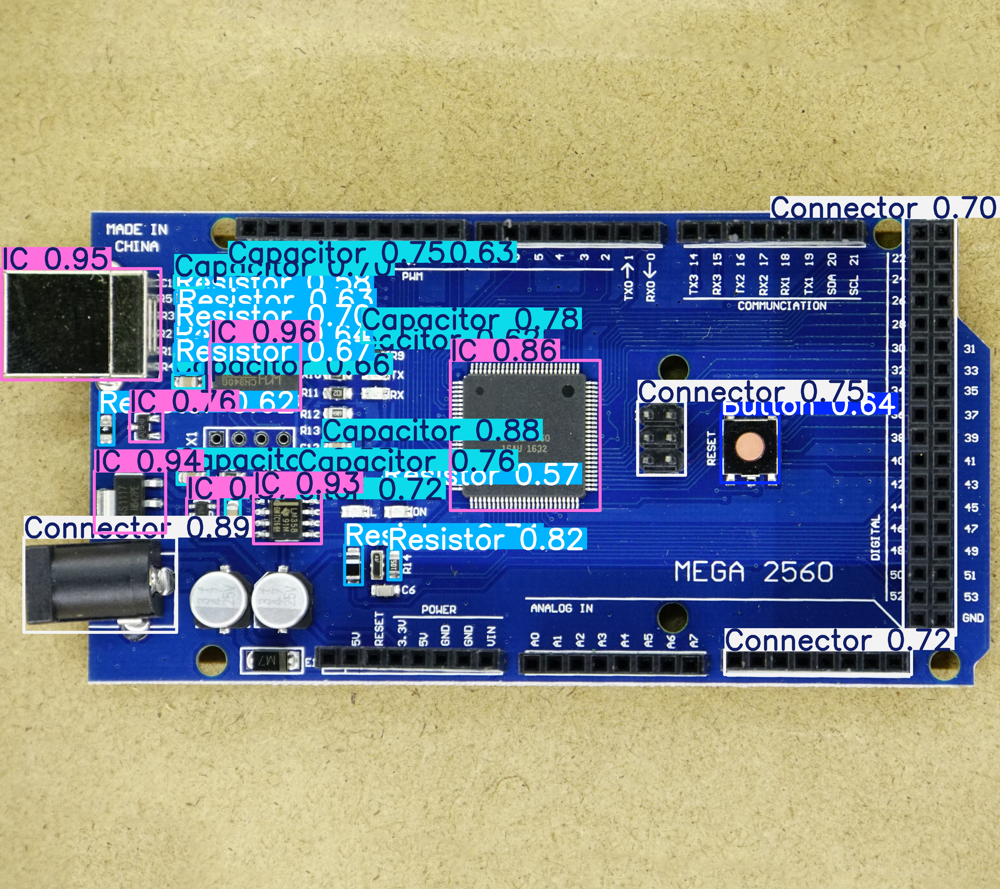

Processing image: /content/drive/MyDrive/data/evaluation/arduno.jpg

image 1/1 /content/drive/MyDrive/data/evaluation/arduno.jpg: 672x960 9 Capacitors, 7 Connectors, 2 Electrolytic Capacitors, 8 ICs, 6 Resistors, 68.6ms
Speed: 6.4ms preprocess, 68.6ms inference, 1.6ms postprocess per image at shape (1, 3, 672, 960)
Results saved to runs/detect/predict


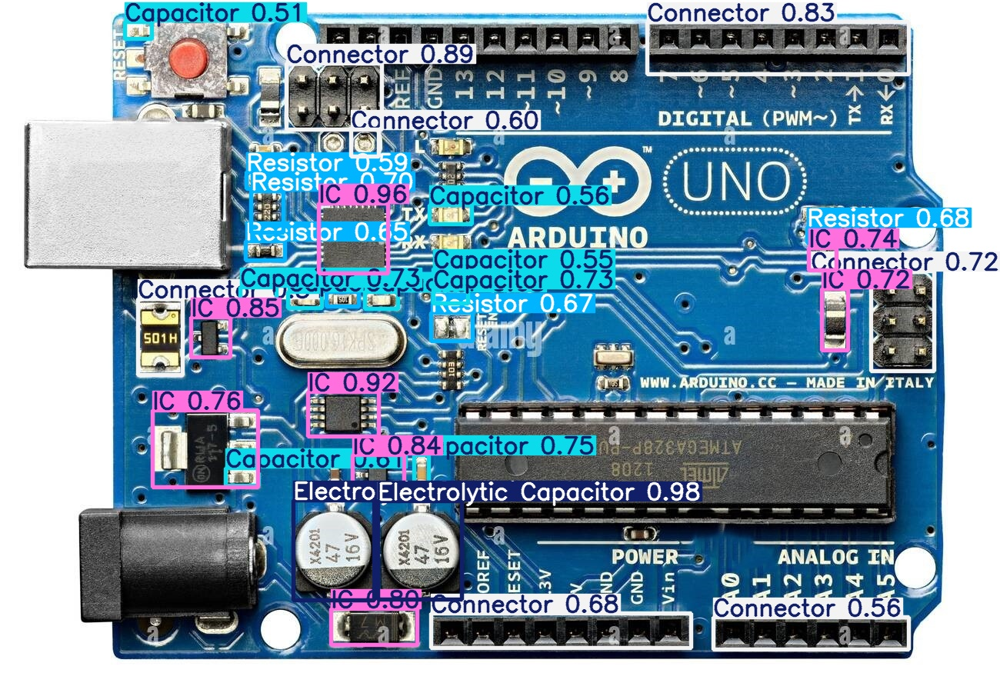

Processing image: /content/drive/MyDrive/data/evaluation/rasppi.jpg

image 1/1 /content/drive/MyDrive/data/evaluation/rasppi.jpg: 640x960 6 Capacitors, 8 Connectors, 1 Electrolytic Capacitor, 8 ICs, 2 Leds, 7 Resistors, 55.4ms
Speed: 9.5ms preprocess, 55.4ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 960)
Results saved to runs/detect/predict


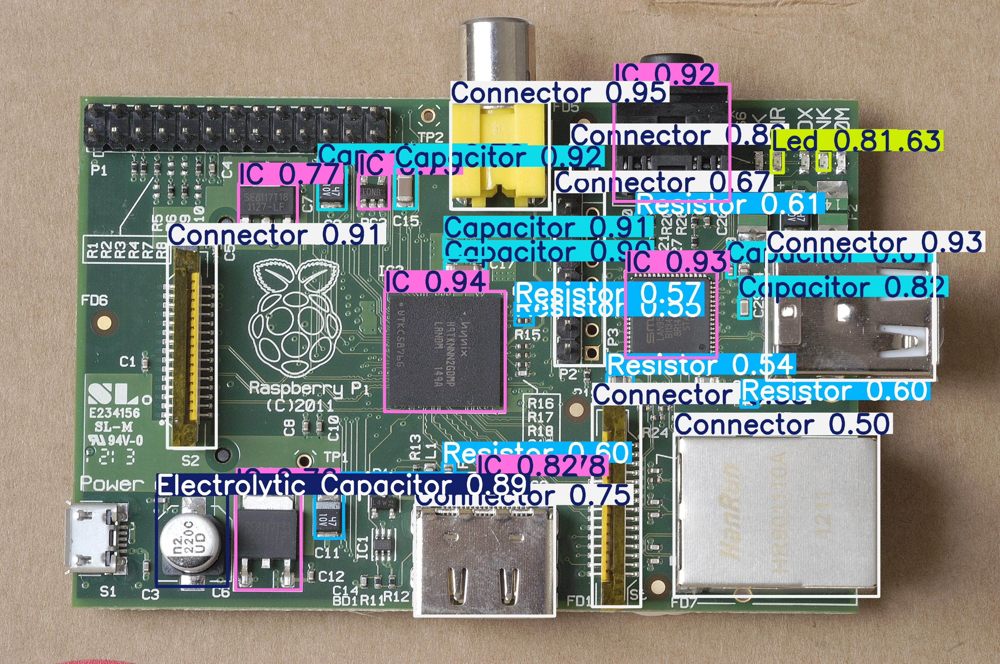

Evaluation complete. Check the results in the 'runs/detect' directory.


In [8]:
''' Step 3: YOLOv8 Evaluation with Dynamic Model Path '''

from ultralytics import YOLO
from IPython.display import Image, display
import os

# Use the exact path where your training results were saved
trained_model_path = 'runs/detect/pcb_model_training_process/weights/best.pt'

# Verify the trained model path
if not os.path.exists(trained_model_path):
    raise FileNotFoundError(f"Trained model not found at: {trained_model_path}. Ensure training completed successfully.")

print(f"Using trained model from: {trained_model_path}")

# Load the YOLO model
model = YOLO(trained_model_path)
print("Trained model loaded successfully.")

# Paths to evaluation images
evaluation_images = [
    '/content/drive/MyDrive/data/evaluation/ardmega.jpg',
    '/content/drive/MyDrive/data/evaluation/arduno.jpg',
    '/content/drive/MyDrive/data/evaluation/rasppi.jpg'
]

# Evaluate images and save results
for image_path in evaluation_images:
    if not os.path.exists(image_path):
        print(f"Image not found: {image_path}")
        continue

    print(f"Processing image: {image_path}")
    results = model.predict(source=image_path, save=True, conf=0.5, imgsz=960)

    # Display the saved annotated image
    result_img_dir = 'runs/detect'
    detect_dirs = [os.path.join(result_img_dir, d) for d in os.listdir(result_img_dir) if os.path.isdir(os.path.join(result_img_dir, d))]
    if not detect_dirs:
        print(f"No detection results found in: {result_img_dir}")
        continue

    latest_result_dir = sorted(detect_dirs)[-1]
    result_img_path = os.path.join(latest_result_dir, os.path.basename(image_path))
    if os.path.exists(result_img_path):
        display(Image(filename=result_img_path))
    else:
        print(f"Result image not found for: {image_path}")

print("Evaluation complete. Check the results in the 'runs/detect' directory.")
